In [20]:
# Standard imports
import glob

# 3rd party imports
import cv2
import matplotlib.pyplot as plt
import numpy as np 
from pprint import pprint
import SimpleITK as sitk

In [21]:
def read_tif(filepath):
    """
    Read tiff files using SimpleITK
    
    Args:
        filepath: str, path to tiff file
        
    Returns:
        image: np.ndarray, tiff image
    """
    image = sitk.ReadImage(filepath)
    image = sitk.GetArrayFromImage(image)
    return image


def auto_contrast(data: np.ndarray, alpha: float = None, beta: float = None) -> np.ndarray:
    """
    Preprocess tiff files to automatically adjust brightness and contrast.
    https://stackoverflow.com/questions/56905592/automatic-contrast-and-brightness-adjustment-of-a-color-photo-of-a-sheet-of-pape
    """
    if not alpha:
        alpha = np.iinfo(data.dtype).max / (np.max(data) - np.min(data))
    if not beta:
        beta = -np.min(data) * alpha
    img = cv2.convertScaleAbs(data.copy(), alpha=alpha, beta=beta)
    return img

In [ ]:
data_folder_path = "data/ch0/"
start_idx = 5
end_idx = None

# Read all tif files in the folder
data_files = sorted(glob.glob(data_folder_path + "*.tif"))
pprint(data_files[start_idx:end_idx])


#image_ch0 = read_tif(ch0_path)

['data/ch0/T9_52ms_488-150_560-150_640-200_4.33zoom_1.5x_bothlaser_z=3um_2607planes '
 '- Pos 7 7 [1] 3DMontage Complete_XY1726268046_Z1303_T0_C0.tif',
 'data/ch0/T9_52ms_488-150_560-150_640-200_4.33zoom_1.5x_bothlaser_z=3um_2607planes '
 '- Pos 7 7 [1] 3DMontage Complete_XY1726268046_Z1304_T0_C0.tif',
 'data/ch0/T9_52ms_488-150_560-150_640-200_4.33zoom_1.5x_bothlaser_z=3um_2607planes '
 '- Pos 7 7 [1] 3DMontage Complete_XY1726268046_Z1305_T0_C0.tif',
 'data/ch0/T9_52ms_488-150_560-150_640-200_4.33zoom_1.5x_bothlaser_z=3um_2607planes '
 '- Pos 7 7 [1] 3DMontage Complete_XY1726268046_Z1306_T0_C0.tif',
 'data/ch0/T9_52ms_488-150_560-150_640-200_4.33zoom_1.5x_bothlaser_z=3um_2607planes '
 '- Pos 7 7 [1] 3DMontage Complete_XY1726268046_Z1307_T0_C0.tif',
 'data/ch0/T9_52ms_488-150_560-150_640-200_4.33zoom_1.5x_bothlaser_z=3um_2607planes '
 '- Pos 7 7 [1] 3DMontage Complete_XY1726268046_Z1308_T0_C0.tif',
 'data/ch0/T9_52ms_488-150_560-150_640-200_4.33zoom_1.5x_bothlaser_z=3um_2607planes '
 '

Run stats on image and show histogram

Image shape: (14233, 12249)
Image type: uint16
Image min: 0
Image max: 7055
Image mean: 375.42261170021567
Image std: 234.27123795250063
Image mean + 3 std: 1078.2363255577175
Image mean + 2 std: 843.9650876052169
Image mean + 1 std: 609.6938496527163
Image mean - 1 std: 141.15137374771504
Image mean - 2 std: -93.11986420478559
Image mean - 3 std: -327.3911021572862


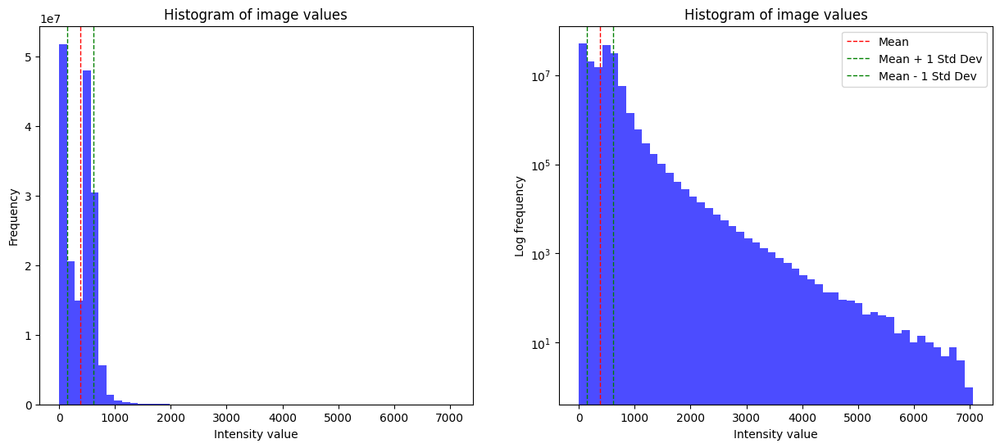

In [4]:
# Show statistics of the image
image_min = image_ch0.min()
image_max = image_ch0.max()
image_mean = image_ch0.mean()
image_std = image_ch0.std()

print("Image shape:", image_ch0.shape)
print("Image type:", image_ch0.dtype)
print("Image min:", image_min)
print("Image max:", image_max)
print("Image mean:", image_mean)
print("Image std:", image_std)
print("Image mean + 3 std:", image_mean + 3 * image_std)
print("Image mean + 2 std:", image_mean + 2 * image_std)
print("Image mean + 1 std:", image_mean + image_std)
print("Image mean - 1 std:", image_mean - image_std)
print("Image mean - 2 std:", image_mean - 2 * image_std)
print("Image mean - 3 std:", image_mean - 3 * image_std)

# Plot histogram of image values
plt.figure(figsize=(15, 6))
plt.subplot(1, 2, 1)
plt.hist(image_ch0.flatten(), bins=50, color='blue', alpha=0.7)
plt.title("Histogram of image values")
plt.xlabel("Intensity value")
plt.ylabel("Frequency")
plt.axvline(image_mean, color='red', linestyle='dashed', linewidth=1, label='Mean')  # Add lines for mean and standard deviation
plt.axvline(image_mean + image_std, color='green', linestyle='dashed', linewidth=1, label='Mean + 1 Std Dev')
plt.axvline(image_mean - image_std, color='green', linestyle='dashed', linewidth=1, label='Mean - 1 Std Dev')
# Second plot with log scale
plt.subplot(1, 2, 2)
plt.hist(image_ch0.flatten(), bins=50, color='blue', alpha=0.7)
plt.yscale('log')
plt.title("Histogram of image values")
plt.xlabel("Intensity value")
plt.ylabel("Log frequency")
plt.axvline(image_mean, color='red', linestyle='dashed', linewidth=1, label='Mean')
plt.axvline(image_mean + image_std, color='green', linestyle='dashed', linewidth=1, label='Mean + 1 Std Dev')
plt.axvline(image_mean - image_std, color='green', linestyle='dashed', linewidth=1, label='Mean - 1 Std Dev')

# Add legend
plt.legend()
plt.show()

Try example threshold on raw image

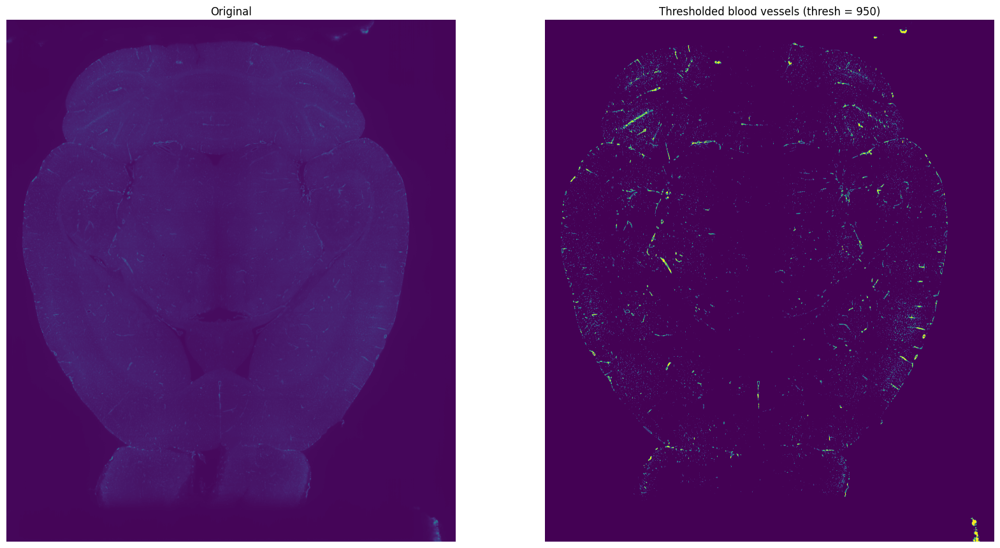

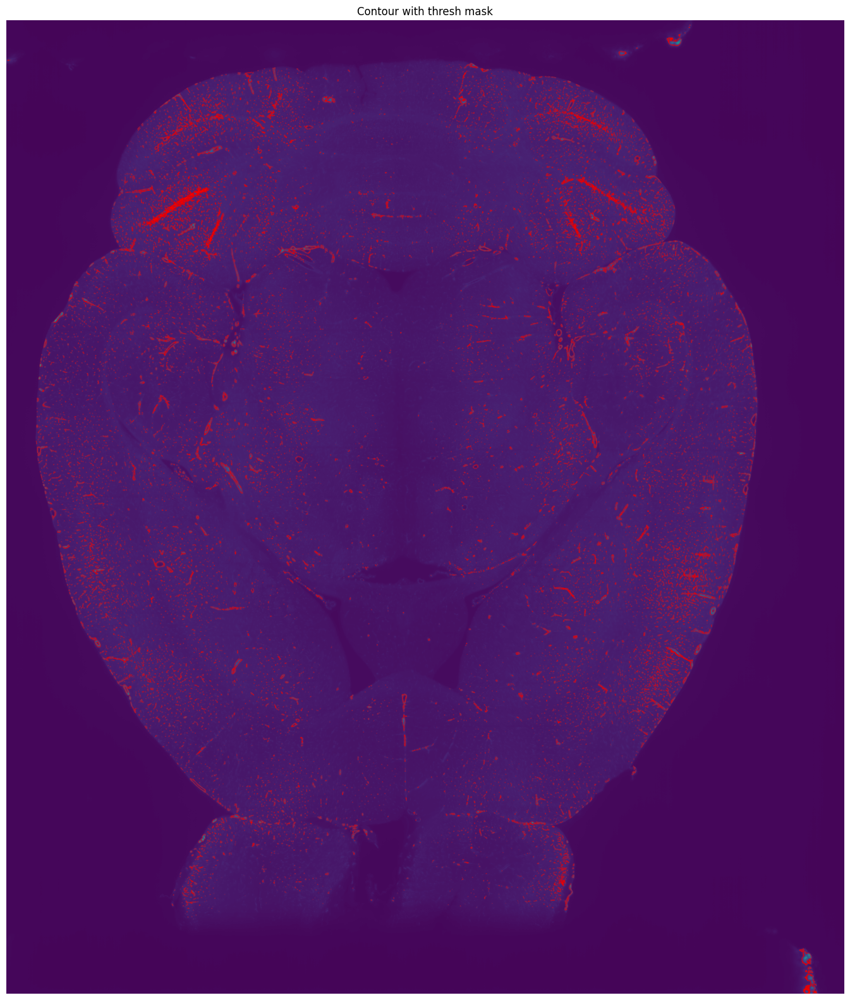

In [5]:
thresh = 950

thresh_mask = image_ch0 > thresh
thresh_mask = thresh_mask.astype(bool)

plt.figure(figsize=(20, 20))  
plt.subplot(1, 2, 1)  # Original image
plt.imshow(image_ch0, cmap='viridis')
plt.title("Original")
plt.axis('off')
plt.subplot(1, 2, 2)  # Thresholded mask
plt.imshow(thresh_mask, cmap='viridis')
plt.title(f"Thresholded blood vessels (thresh = {thresh})")
plt.axis('off')
plt.show()

# Show contour on the image
plt.figure(figsize=(20, 20))
plt.imshow(image_ch0, cmap='viridis')
plt.title("Contour with thresh mask")
plt.contour(thresh_mask, colors='red', linewidths=1, alpha=0.3)
plt.axis('off')
plt.show()

Apply exponential scaling on the image

Enhanced scaled image:
Image shape: (14233, 12249)
Image type: float64
Image min: 0.0
Image max: 7055.0
Image mean: 27.75693129803099
Image std: 36.34035771154178
Image mean + 3 std: 136.77800443265633
Image mean + 2 std: 100.43764672111455
Image mean + 1 std: 64.09728900957276
Image mean - 1 std: -8.583426413510786
Image mean - 2 std: -44.92378412505256
Image mean - 3 std: -81.26414183659435


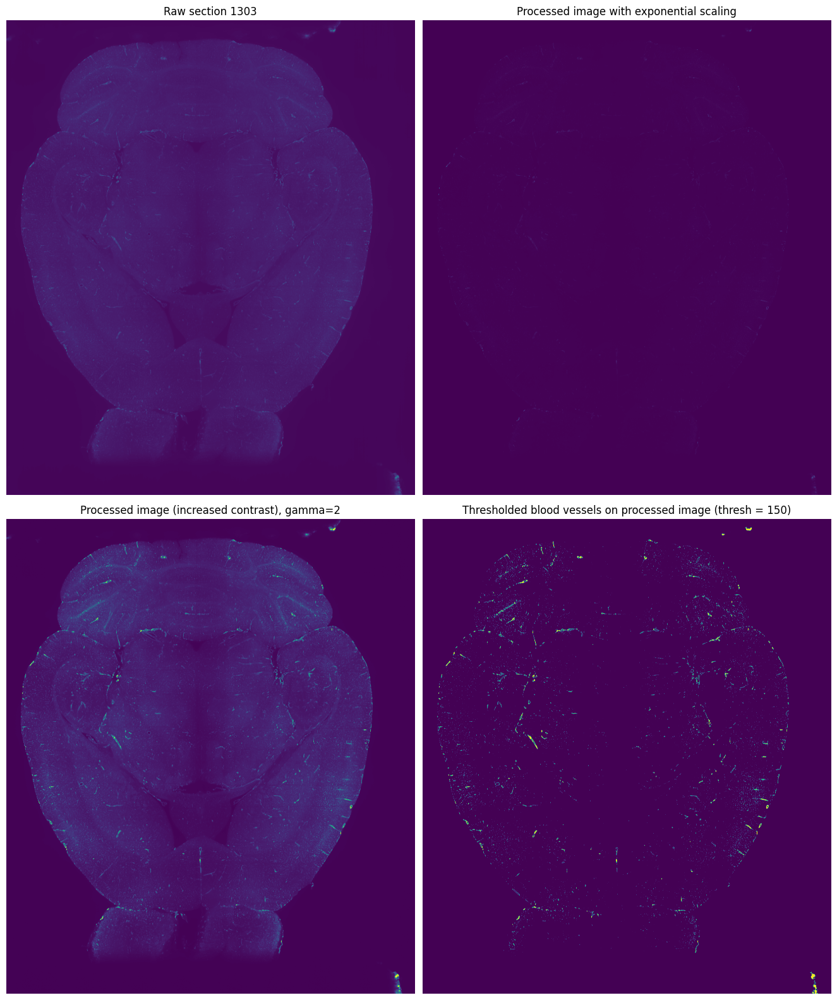

In [6]:
gamma = 2  # You can adjust this value to control the contrast enhancement
contrast_alpha = 0.5  # Try 0.15 You can adjust this value to control the brightness enhancement
thresh = 150

# Normalize the image to the range [0, 1]
image_normalized = image_ch0 / image_ch0.max()

# Apply the exponential transformation
image_enhanced = np.power(image_normalized, gamma)
# Rescale the image back to the original intensity range
image_enhanced = image_enhanced * image_ch0.max()

thresh_mask = image_enhanced > thresh
thresh_mask = thresh_mask.astype(bool)

# Show statistics of the image
enhanced_min = image_enhanced.min()
enhanced_max = image_enhanced.max()
enhanced_mean = image_enhanced.mean()
enhanced_std = image_enhanced.std()

print("Enhanced scaled image:")
print("Image shape:", image_enhanced.shape)
print("Image type:", image_enhanced.dtype)
print("Image min:", enhanced_min)
print("Image max:", enhanced_max)
print("Image mean:", enhanced_mean)
print("Image std:", enhanced_std)
print("Image mean + 3 std:", enhanced_mean + 3 * enhanced_std)
print("Image mean + 2 std:", enhanced_mean + 2 * enhanced_std)
print("Image mean + 1 std:", enhanced_mean + enhanced_std)
print("Image mean - 1 std:", enhanced_mean - enhanced_std)
print("Image mean - 2 std:", enhanced_mean - 2 * enhanced_std)
print("Image mean - 3 std:", enhanced_mean - 3 * enhanced_std)

"""
# Plot histogram of image values
plt.figure(figsize=(15, 6))
plt.subplot(1, 2, 1)
plt.hist(image_enhanced.flatten(), bins=50, color='blue', alpha=0.7)
plt.title("Histogram of enhanced image values")
plt.xlabel("Intensity value")
plt.ylabel("Frequency")
plt.axvline(enhanced_mean, color='red', linestyle='dashed', linewidth=1, label='Mean')  # Add lines for mean and standard deviation
plt.axvline(enhanced_mean + enhanced_std, color='green', linestyle='dashed', linewidth=1, label='Mean + 1 Std Dev')
plt.axvline(enhanced_mean - enhanced_std, color='green', linestyle='dashed', linewidth=1, label='Mean - 1 Std Dev')
# Second plot with log scale
plt.subplot(1, 2, 2)
plt.hist(image_enhanced.flatten(), bins=50, color='blue', alpha=0.7)
plt.yscale('log')
plt.title("Histogram of enhanced image values")
plt.xlabel("Intensity value")
plt.ylabel("Log frequency")
plt.axvline(enhanced_mean, color='red', linestyle='dashed', linewidth=1, label='Mean')
plt.axvline(enhanced_mean + enhanced_std, color='green', linestyle='dashed', linewidth=1, label='Mean + 1 Std Dev')
plt.axvline(enhanced_mean - enhanced_std, color='green', linestyle='dashed', linewidth=1, label='Mean - 1 Std Dev')
# Add legend
plt.legend()
plt.show()
"""

# Plot the original and enhanced images
plt.figure(figsize=(17, 20))
plt.subplot(2, 2, 1)  # Original image
plt.imshow(image_ch0, cmap='viridis')
plt.title("Raw section 1303")
plt.axis('off')
plt.subplot(2, 2, 2)  # Enhanced image
plt.imshow(image_enhanced, cmap='viridis')
plt.title("Processed image with exponential scaling")
plt.axis('off')

# Plot enhanced image no modifications
#plt.figure(figsize=(20, 20))
plt.subplot(2, 2, 3)
plt.imshow(auto_contrast(image_enhanced, alpha=contrast_alpha), cmap='viridis')
plt.title(f"Processed image (increased contrast), gamma={gamma}")
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(thresh_mask, cmap='viridis')
plt.title(f"Thresholded blood vessels on processed image (thresh = {thresh})")
plt.axis('off')

plt.subplots_adjust(wspace=0.0001, hspace=0.05)  # Adjust horizontal and vertical space between subplots
plt.show()

Try Naive thresholding

In [18]:
def show_4(original_image, contrast_enhanced, thresholded, xlim=None, ylim=None):
    plt.figure(figsize=(20, 20))
    plt.subplot(2, 2, 1)
    plt.imshow(original_image, cmap='gray')
    plt.title("Original zoomed")
    if xlim is not None:
        plt.xlim(xlim)
        plt.ylim(ylim[::-1])

    plt.subplot(2, 2, 2)
    plt.imshow(contrast_enhanced, cmap='gray')
    plt.title("Contrast enhanced")
    if xlim is not None:
        plt.xlim(xlim)
        plt.ylim(ylim[::-1])

    plt.subplot(2, 2, 3)
    plt.imshow(thresholded, cmap='gray')
    plt.title("Thresholded")
    if xlim is not None:
        plt.xlim(xlim)
        plt.ylim(ylim[::-1])

    plt.subplot(2, 2, 4)
    plt.imshow(original_image, cmap='gray')
    plt.contour(thresholded, colors='red', linewidths=0.5, alpha=0.35)
    plt.title("Contrast enhanced + contour")
    if xlim is not None:
        plt.xlim(xlim)
        plt.ylim(ylim[::-1])
    plt.show()
    
    
def save_figure(image, filename, contours=None):
    plt.figure(figsize=(20, 20))
    plt.imshow(image, cmap='gray')
    if contours is not None:
        plt.contour(contours, colors='red', linewidths=0.15, alpha=0.35)
    plt.axis('off')
    plt.savefig(filename, dpi=600, bbox_inches='tight')
    print(f"Saved figure to {filename}")

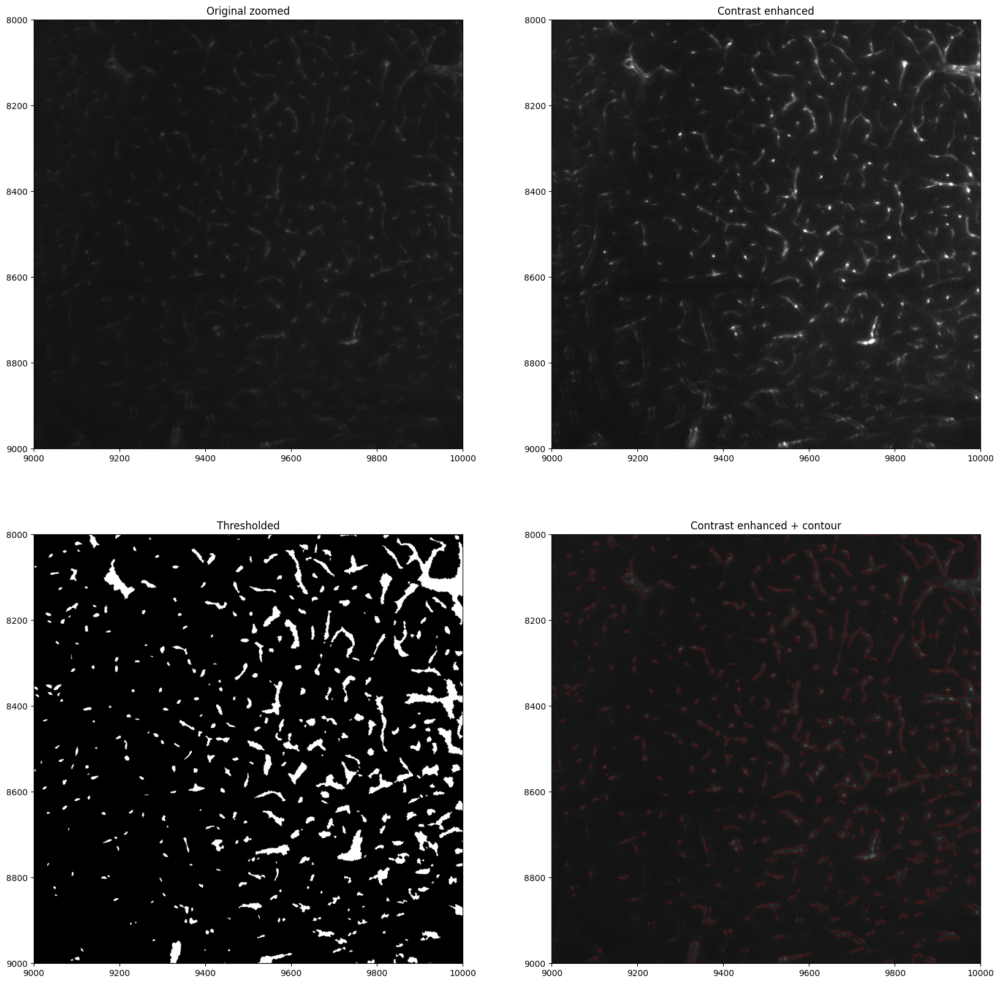

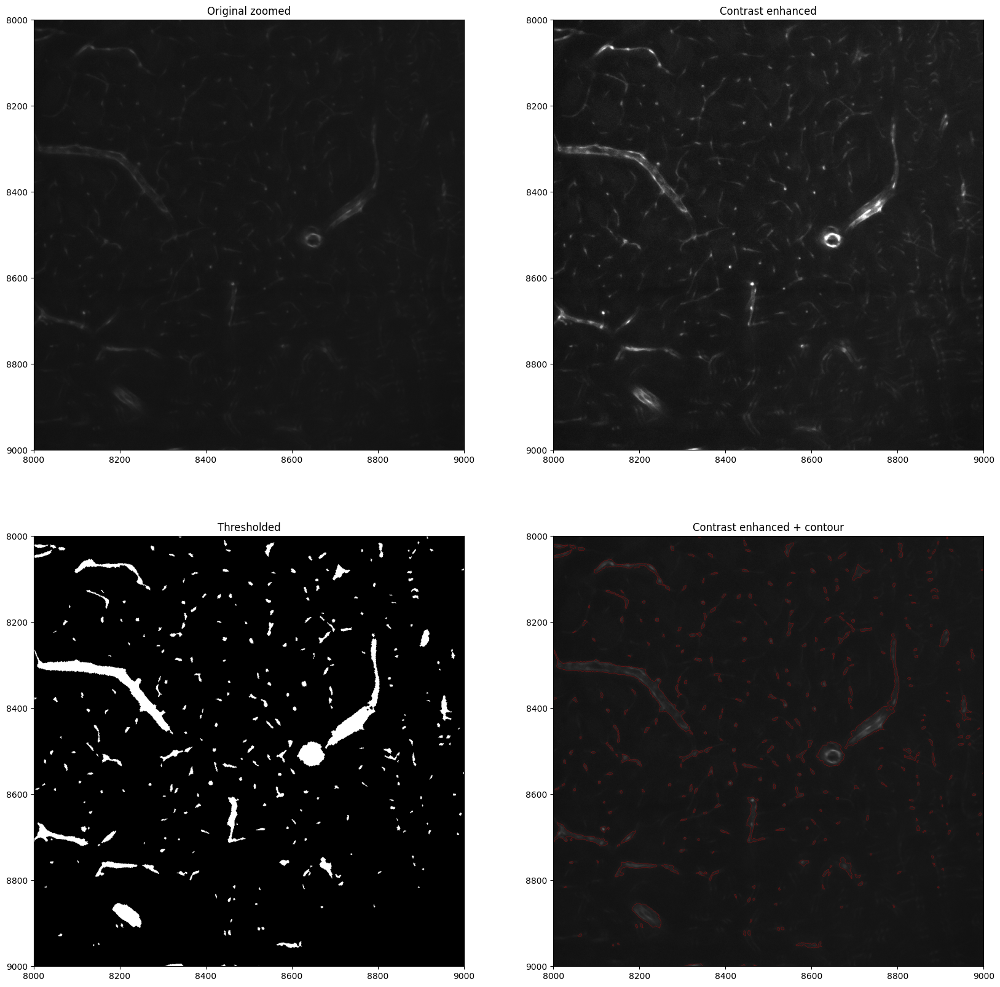

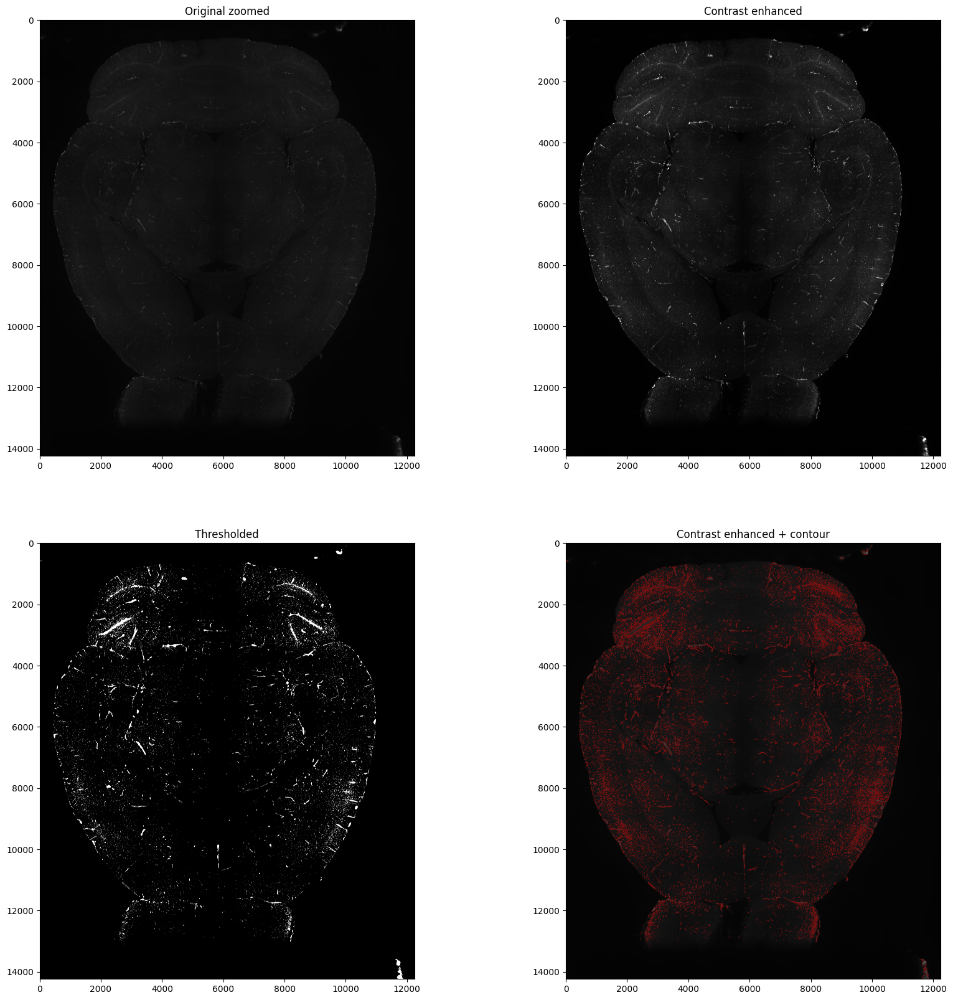

Saved figure to 1303_original.png
Saved figure to 1303_contours.png


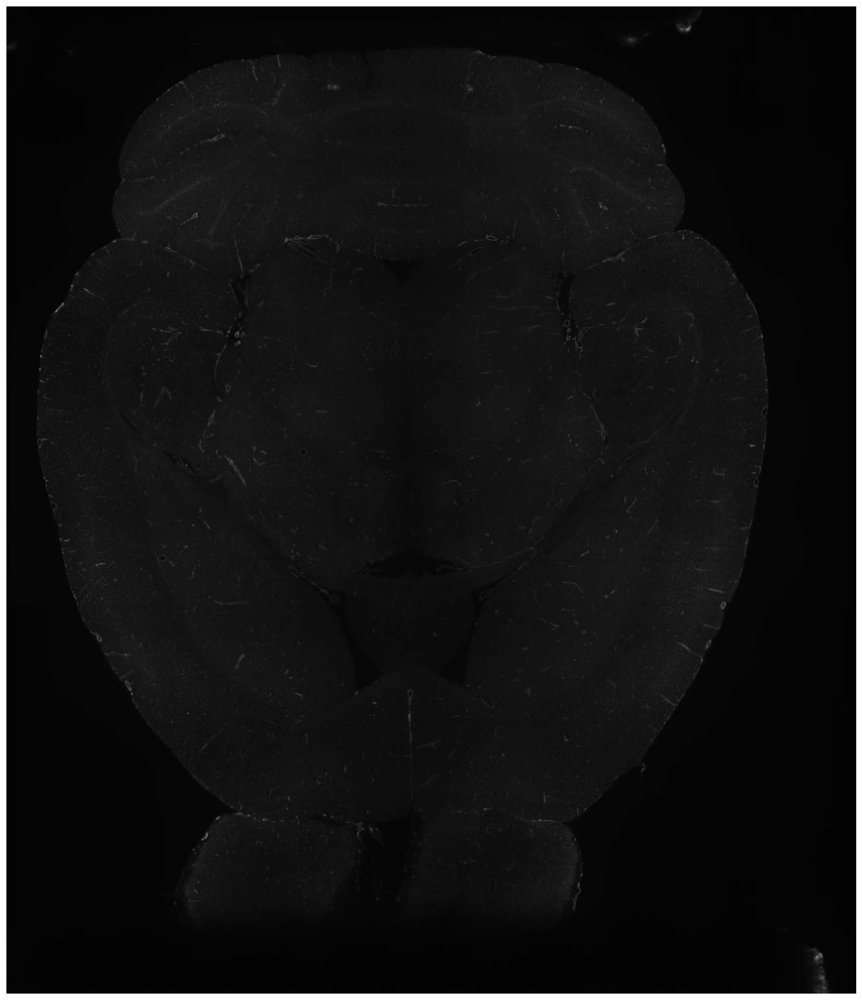

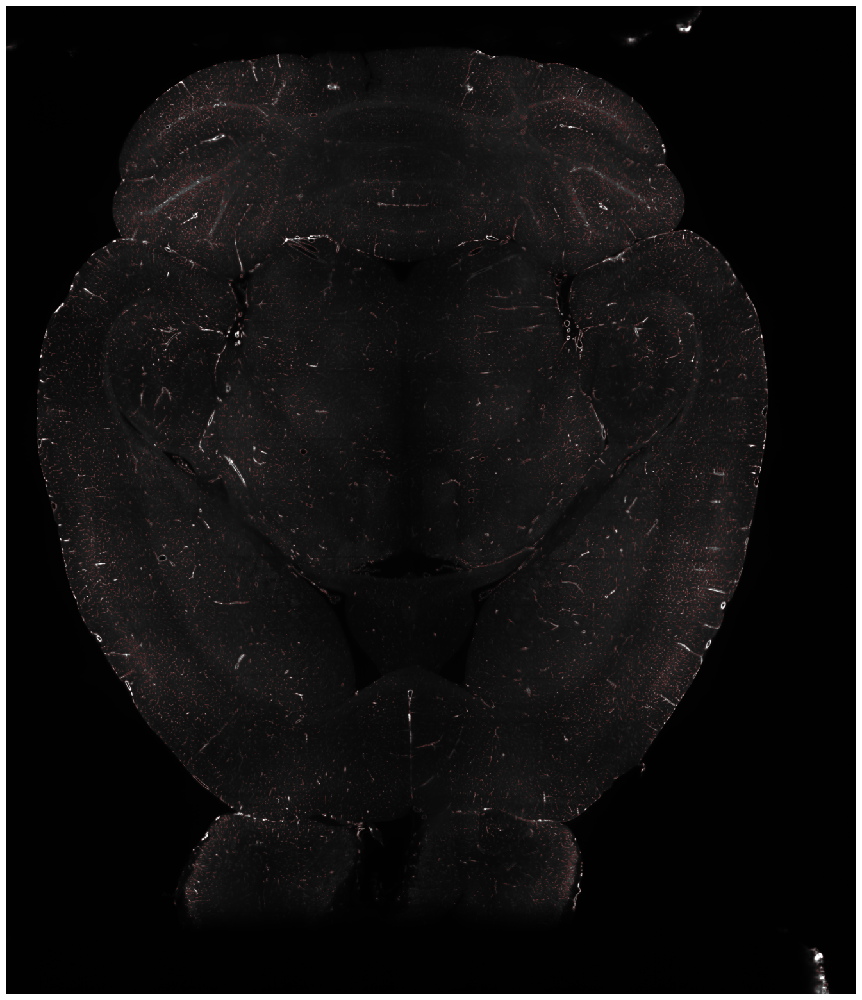

In [20]:
from skimage.morphology import remove_small_objects, binary_closing, disk
from scipy.ndimage import binary_fill_holes


min_size = 10  # Minimum size of objects to keep
thresh = 45  # 35
xlim = [9000, 10000]  # 8000, 9000 or 9000, 10000
ylim = [8000, 9000]  # 8000, 9000

#xlim = None

contrast_image = auto_contrast(image_enhanced, alpha=contrast_alpha)

thresh_contrast = contrast_image.copy()
#thresh_contrast = thresh_contrast[8000:9000, 8000:9000]
thresh_contrast[thresh_contrast < thresh] = 0
thresh_contrast[thresh_contrast != 0] = 1
thresh_contrast = thresh_contrast.astype(bool)

thresh_contrast = remove_small_objects(thresh_contrast, min_size=min_size)

# Fill holes
thresh_contrast = binary_fill_holes(thresh_contrast)

selem = disk(2)  # Structuring element for closing
thresh_contrast = binary_closing(thresh_contrast, selem)

show_4(image_ch0, contrast_image, thresh_contrast, xlim=xlim, ylim=ylim)

show_4(image_ch0, contrast_image, thresh_contrast, xlim=ylim, ylim=ylim)

show_4(image_ch0, contrast_image, thresh_contrast, xlim=None, ylim=None)

#save_figure(image_ch0, "1303_original.png")
save_figure(image_ch0, "1303_original.png")
save_figure(contrast_image, "1303_contours.png", contours=thresh_contrast)

Try adaptive thresholding

from skimage.morphology import remove_small_objects, binary_closing, disk
from scipy.ndimage import binary_fill_holes, gaussian_filter
import cv2


min_size = 10  # Minimum size of objects to keep
thresh = 35

contrast_zoom = auto_contrast(image_enhanced, alpha=contrast_alpha)

thresh_contrast = contrast_zoom.copy()
thresh_contrast = thresh_contrast[8000:9000, 8000:9000]
thresh_contrast = gaussian_filter(thresh_contrast, sigma=1)

#th2 = cv2.adaptiveThreshold(thresh_contrast, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)

plt.imshow(thresh_contrast, cmap='gray')
plt.title("Contrast enhanced zoomed")
plt.show()


# Test different thresholding parameters
neighborhood_sizes = [5, 11, 21, 31, 41, 51, 61, 71, 81, 91, 101, 151, 201, 251, 301]
for neighborhood_size in neighborhood_sizes:
    th2 = cv2.adaptiveThreshold(thresh_contrast, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, neighborhood_size, 2)
    plt.figure(figsize=(10, 10))
    plt.imshow(th2, cmap='gray')
    plt.title(f"Adaptive thresholding with neighborhood size {neighborhood_size}")
    plt.show()

plt.imshow(thresh_contrast * th2, cmap='gray')
plt.show()
#thresh_contrast[thresh_contrast < thresh] = 0
#thresh_contrast[thresh_contrast != 0] = 1
#thresh_contrast = thresh_contrast.astype(bool)

#thresh_contrast = remove_small_objects(thresh_contrast, min_size=min_size)

# Fill holes
#thresh_contrast = binary_fill_holes(thresh_contrast)


#selem = disk(2)  # Structuring element for closing
#thresh_contrast = binary_closing(thresh_contrast, selem)

"""
plt.figure(figsize=(10, 10))
plt.imshow(image_ch0, cmap='gray')
plt.title("Original zoomed")
plt.xlim(8000, 9000)
plt.ylim(9000, 8000)
plt.show()

plt.figure(figsize=(10, 10))
plt.imshow(contrast_zoom, cmap='gray')
plt.title("Contrast enhanced zoomed")
plt.xlim(8000, 9000)
plt.ylim(8000, 9000)
plt.show()

plt.figure(figsize=(10, 10))
plt.imshow(th3, cmap='gray')
plt.title("Thresholded")
plt.show()

plt.figure(figsize=(10, 10))
plt.imshow(image_ch0[8000:9000, 8000:9000], cmap='gray')
plt.contour(th3, colors='red', linewidths=1, alpha=0.3)
plt.title("Contrast enhanced zoomed + contour")
plt.show()
"""